# Use case 2 - Cab industry

## Library

In [327]:
## Normal libs to work with data
## adding support for large, multi-dimensional arrays and matrices.
import numpy as np 
## data structures and operations for manipulating numerical tables and time series.
import pandas as pd 

################################################################################
# Visualization
## the output of plotting commands is displayed inline within frontends like the Jupyter notebook, directly below the code cell that produced it.
%matplotlib inline 
## provides an implicit, MATLAB-like, way of plotting
import matplotlib.pyplot as plt 
## provides a high-level interface for drawing attractive and informative statistical
import seaborn as sns

################################################################################
## Utility
## automate data analysis
import pandas_profiling as pp
import re
from datetime import datetime, timedelta

################################################################################
## Time series analysis
from pmdarima import auto_arima
from statsmodels.tsa.seasonal import seasonal_decompose

## Read data

### Read cab data

In [138]:
df_cab = pd.read_csv("Cab_Data.csv")

In [139]:
df_cab.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.776


In [140]:
# check basic information
df_cab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


### Read transaction data

In [141]:
df_transaction = pd.read_csv("Transaction_ID.csv")

In [142]:
df_transaction.head()

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


In [143]:
# check basic information
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


Comment: We can see that there is common column "Transaction ID" between cab data and transaction data. We will join together in data consolidation step

### Read customer data

In [144]:
df_customer = pd.read_csv("Customer_ID.csv")

In [145]:
df_customer.head()

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


Comment: We can see that there is common column "Customer ID" between customer data and transaction data. We will join together in data consolidation step

In [146]:
# check basic information
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


### Read city data

In [147]:
df_city = pd.read_csv("City.csv", encoding='utf-8', sep=";")

In [148]:
df_city.head()

,City,Population,Users
0,NEW YORK NY,8405837,302149
1,CHICAGO IL,1955130,164468
2,LOS ANGELES CA,1595037,144132
3,MIAMI FL,1339155,17675
4,SILICON VALLEY,1177609,27247


Comment: We can see that there is common column "City" between city data and cab data. We will join together in data consolidation step

In [149]:
# check basic information
df_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     int64 
 2   Users       20 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 608.0+ bytes


Comment: There are only 20 cities in the US. We will find more information on the internet to add more value to this dataset

## Preprocessing before joining dataframe together

Comment: Since the data after join will be difficult to feature engineer, therefore, I will perform FE before join data

### Cab data

#### Feature engineering: Profit (before tax) = Price charged - Cost of trip

In [150]:
df_cab['Profit'] = df_cab['Price Charged'] - df_cab['Cost of Trip']

In [151]:
df_cab.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666


#### Feature engineering: Profit/km (before tax) = Profit / KM Travelled

In [152]:
df_cab['Profit/km'] = (df_cab['Profit'] / df_cab['KM Travelled']).round(decimals=2)

In [153]:
df_cab.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83


#### Format travel date

Comment: 
- At first I am not sure the Date of Travel is correct or not, but as I investigated, it is the count of day from the year of 1900 (Excel start date). It would be better if the department provide more information about this.

In [154]:
# create a function to format to date
def to_date_format(n):
    # create string date 1900 + number of days. Ex: "10-01-2016"
    date_str =(datetime(1900,1,1) + timedelta(n-2)).strftime("%d-%m-%Y")
    # format to date type
    date_date =  datetime.strptime(date_str, "%d-%m-%Y")
    return date_date

In [155]:
# apply to the "Date of Travel" column
df_cab['Date of Travel'] = df_cab['Date of Travel'].apply(to_date_format)

In [156]:
df_cab.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83


In [157]:
# checking the type
df_cab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Transaction ID  359392 non-null  int64         
 1   Date of Travel  359392 non-null  datetime64[ns]
 2   Company         359392 non-null  object        
 3   City            359392 non-null  object        
 4   KM Travelled    359392 non-null  float64       
 5   Price Charged   359392 non-null  float64       
 6   Cost of Trip    359392 non-null  float64       
 7   Profit          359392 non-null  float64       
 8   Profit/km       359392 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(2)
memory usage: 24.7+ MB


In [158]:
min(df_cab['Date of Travel'])

Timestamp('2016-01-02 00:00:00')

In [159]:
max(df_cab['Date of Travel'])

Timestamp('2018-12-31 00:00:00')

#### Feature engineering: Date Of Week = day_of_week(Date of Travel)

Comment: Extract date of week to check if there was trend or pattern. When we model time series analysis and found insight, we will drill down further in this feature

In [160]:
df_cab['Day Of Week'] = df_cab['Date of Travel'].dt.day_name()

In [161]:
df_cab.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday


Comment:
- The date should begin from 31/01/2016 to 31/12/2018 as provided. However, the data after preprocessed covers from 02-01-2016 to 31-12-2018. There must be inconsistency from the source


### Customer data

#### Binning: Age range

Comment: Before binning the age range, we need to investigate the min, max value, and distribution

In [162]:
# investigate the min, max value
min(df_customer['Age'])

18

In [163]:
# investigate the min, max value
max(df_customer['Age'])

65

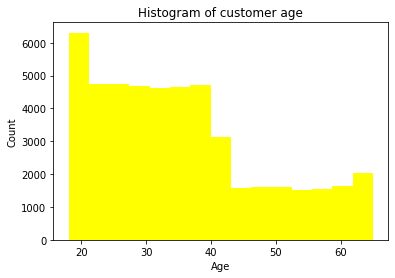

In [164]:
# investigate the distribution
plt.hist(df_customer['Age'], bins=15)
plt.ylabel('Count')
plt.xlabel('Age')
plt.title('Histogram of customer age')
plt.show()

Comment: The customers are mainly from the 20~40 years old. Since the data from 18-65 years old. We will bin data into age brackets [18-30], [31-40], [41-50], [51-65] 

In [165]:
age_bins = [17, 30, 40, 50, 65]
age_labels = ['18-30', '30-40', '40-50', '50-65']
df_customer['Age Bracket'] = pd.cut(df_customer['Age'], 
                               bins=age_bins, 
                               labels=age_labels)


In [166]:
# check data
df_customer.head()

,Customer ID,Gender,Age,Income (USD/Month),Age Bracket
0,29290,Male,28,10813,18-30
1,27703,Male,27,9237,18-30
2,28712,Male,53,11242,50-65
3,28020,Male,23,23327,18-30
4,27182,Male,33,8536,30-40


#### Binning: Income range

In [167]:
# investigate the min, max value
min(df_customer['Income (USD/Month)'])

2000

In [168]:
# investigate the min, max value
max(df_customer['Income (USD/Month)'])

35000

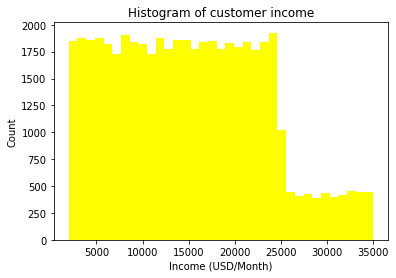

In [169]:
# investigate the distribution
plt.hist(df_customer['Income (USD/Month)'], bins=35)
plt.ylabel('Count')
plt.xlabel('Income (USD/Month)')
plt.title('Histogram of customer income')
plt.show()

Comment: We can notice that the majority of customer is in the range 2000~24000 USD/Month. We will bin data into age brackets [2000-15000], [15001-25000], [25001-35000] 

In [170]:
income_bins = [1999, 15000, 25000, 35000]
income_labels = ['2k-15k', '15k-25k', '25k-35k']
df_customer['Income Bracket'] = pd.cut(df_customer['Income (USD/Month)'], 
                               bins=income_bins, 
                               labels=income_labels)

In [171]:
# check data
df_customer.head()

,Customer ID,Gender,Age,Income (USD/Month),Age Bracket,Income Bracket
0,29290,Male,28,10813,18-30,2k-15k
1,27703,Male,27,9237,18-30,2k-15k
2,28712,Male,53,11242,50-65,2k-15k
3,28020,Male,23,23327,18-30,15k-25k
4,27182,Male,33,8536,30-40,2k-15k


### City data

#### Feature engineering: User/pop Rate = Users / Population

In [172]:
df_city['User/pop Rate %'] = ((df_city['Users'] / df_city['Population']) * 100).round(decimals=2)

In [173]:
df_city.head(2)

,City,Population,Users,User/pop Rate %
0,NEW YORK NY,8405837,302149,3.59
1,CHICAGO IL,1955130,164468,8.41


## Data consolidating

### Join Cab data with Transaction data

In [174]:
# The next step of preprocessing we will check null value later
df_cab_transaction = pd.merge(df_cab,
                             df_transaction,
                             on='Transaction ID',
                             how='left')

In [175]:
df_cab_transaction.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,Customer ID,Payment_Mode
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,29290,Card
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,27703,Card
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,27.568,3.05,Saturday,28712,Cash
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.602,25.798,0.78,Thursday,28020,Cash
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.776,16.844,1.93,Sunday,27182,Card


In [176]:
df_cab_transaction.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Transaction ID  359392 non-null  int64         
 1   Date of Travel  359392 non-null  datetime64[ns]
 2   Company         359392 non-null  object        
 3   City            359392 non-null  object        
 4   KM Travelled    359392 non-null  float64       
 5   Price Charged   359392 non-null  float64       
 6   Cost of Trip    359392 non-null  float64       
 7   Profit          359392 non-null  float64       
 8   Profit/km       359392 non-null  float64       
 9   Day Of Week     359392 non-null  object        
 10  Customer ID     359392 non-null  int64         
 11  Payment_Mode    359392 non-null  object        
dtypes: datetime64[ns](1), float64(5), int64(2), object(4)
memory usage: 35.6+ MB


### Join Cab_Transaction data with Customer data

In [177]:
df_cab_transaction_customer = pd.merge(df_cab_transaction,
                             df_customer,
                             on='Customer ID',
                             how='left')

In [178]:
df_cab_transaction_customer.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Age Bracket,Income Bracket
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,29290,Card,Male,28,10813,18-30,2k-15k
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,27703,Card,Male,27,9237,18-30,2k-15k
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,27.568,3.05,Saturday,28712,Cash,Male,53,11242,50-65,2k-15k
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.602,25.798,0.78,Thursday,28020,Cash,Male,23,23327,18-30,15k-25k
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.776,16.844,1.93,Sunday,27182,Card,Male,33,8536,30-40,2k-15k


In [179]:
df_cab_transaction_customer.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Transaction ID      359392 non-null  int64         
 1   Date of Travel      359392 non-null  datetime64[ns]
 2   Company             359392 non-null  object        
 3   City                359392 non-null  object        
 4   KM Travelled        359392 non-null  float64       
 5   Price Charged       359392 non-null  float64       
 6   Cost of Trip        359392 non-null  float64       
 7   Profit              359392 non-null  float64       
 8   Profit/km           359392 non-null  float64       
 9   Day Of Week         359392 non-null  object        
 10  Customer ID         359392 non-null  int64         
 11  Payment_Mode        359392 non-null  object        
 12  Gender              359392 non-null  object        
 13  Age                 359392 no

### Join Cab_Transaction_Customer data with City data

In [180]:
df_full = pd.merge(df_cab_transaction_customer,
                             df_city,
                             on='City',
                             how='left')

In [181]:
df_full.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Age Bracket,Income Bracket,Population,Users,User/pop Rate %
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,29290,Card,Male,28,10813,18-30,2k-15k,814885,24701,3.03
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,27703,Card,Male,27,9237,18-30,2k-15k,814885,24701,3.03
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.632,27.568,3.05,Saturday,28712,Cash,Male,53,11242,50-65,2k-15k,814885,24701,3.03
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.602,25.798,0.78,Thursday,28020,Cash,Male,23,23327,18-30,15k-25k,814885,24701,3.03
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.776,16.844,1.93,Sunday,27182,Card,Male,33,8536,30-40,2k-15k,814885,24701,3.03


In [182]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Transaction ID      359392 non-null  int64         
 1   Date of Travel      359392 non-null  datetime64[ns]
 2   Company             359392 non-null  object        
 3   City                359392 non-null  object        
 4   KM Travelled        359392 non-null  float64       
 5   Price Charged       359392 non-null  float64       
 6   Cost of Trip        359392 non-null  float64       
 7   Profit              359392 non-null  float64       
 8   Profit/km           359392 non-null  float64       
 9   Day Of Week         359392 non-null  object        
 10  Customer ID         359392 non-null  int64         
 11  Payment_Mode        359392 non-null  object        
 12  Gender              359392 non-null  object        
 13  Age                 359392 no

## Data exploratory

### Univariate analysis - Pandas profiling

Comment: Automate simple univariate analysis by Pandas profiling library

In [183]:
profile = pp.ProfileReport(df_full)
profile

Comment on general information: 
- There is no null/missing value in this consolidated dataset
- There are a total of 18 variables in this consolidated dataset (10 numeric, 7 categorical, 1 datetime)
- There are 359392 rows in the final jointed version
- There are no duplicate row

Comment on univariate analysis:
- Transaction ID: will be the Primary key since it is completely distinct
- Date of Travel: range from 02-01-2016 to 31-12-2018
- Company: There are 2 competitors to invest in: Yellow Cab (76,4%), Pink Cab (23,6%)
- City: New York has the most transaction with 99885 (27,8%)
- KM Travelled: The mean km travel of customer ~22,57 miles (the USA used miles) and the standard deviation ~12.23
- Price Charged: The mean price is ~ 423,44 $ and the standard deviation is ~ 274.38 $ (quite high). The data is left-skewed. 
- Cost of Trip: The mean cost is ~ 286,19 $ and the standard deviation is ~ 158 $ (quite high).
- Day Of Week: Surprisingly, weekends (Fri, Sat, Sun) accounted for 64% of the transaction. It leads to the insight#1: Businesses should prepare more workforce and resources on the weekend occasion
- Payment_Mode: 60% of transactions used cash and 40% used cards. We will investigate further to see whether there is a huge margin of profit between the two methods.
- Gender: Male (57.3%) has a slightly more than female (42.7%)
- Age: The mean age of customers is ~35.3 and the standard deviation is ~12.6
- Income: The mean income of customers is ~15048$ and the standard deviation is ~7969.4$
- Age Bracket: The age bracket of customers is mainly from 18-40 (73.2%)
- Income Bracket: 51.2% of customers have income from 2~ 15k a month. 39.7% of customers have 15~ 25k USD a month.
- Users, Pop: Will provide insights into the bivariate analysis.

Comment on correlation analysis:
- Obviously, KM Travelled has a high positive correlation with Price Charged and Cost of Trip and vice versa
- Customer ID has a correlation with Population and Users, but it is irrelevant so we will skip this
- The population and users have a high positive correlation. Insight#2: In a big city the user of cab companies is higher than the city which has low population

### Bivariate analysis - Coding

#### Categorical vs Categorical

In [184]:
## a bug in google colab, need to enable inline after pandas profiling
%matplotlib inline

## automate bivariate analysis (categorical vs categorical)
def compare_cate_cate(list_columns, df):

    ## getting length of list 
    length = len(list_columns)
   
    ## color palette for each figure
    color_lst = ['Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens',
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens', 
                 'Purples', 'Reds', 'Oranges', 'Blues', 'Reds', 'Greens', 
                 'Purples', 'Reds', 'Oranges']
    color_idx = 0

    ## iterating the index  
    for i in range(length):
        j = i + 1
        while j < length:
            

            ## setting fig size
            plt.figure(figsize=(22,17))
            ## figure 1: count value
            ax1 = plt.subplot2grid((2,2),(0,0))
            ax1 = sns.heatmap(pd.crosstab(df[list_columns[j]], df[list_columns[i]]),
                              cmap=color_lst[color_idx],
                              annot=True, ## show number
                              linewidths=0,
                              fmt='g', 
                              cbar_kws={'label': 'Count'})
            ax1 = plt.title(list_columns[i] + ' Count by ' + list_columns[j] + ' - Crosstab\n Heatmap Distribution (Count)')
            
            ## figure 2: percentage value
            ax2 = plt.subplot2grid((2,2),(0,1))
            ax2 = sns.heatmap(pd.crosstab(df[list_columns[j]], df[list_columns[i]],normalize=True).mul(100).round(0),
                              cmap=color_lst[color_idx],
                              annot=True,
                              fmt='g',
                              cbar_kws={'label': 'Percentage %'})
            ax2 = plt.title(list_columns[i] + ' Count by ' + list_columns[j] + ' - Crosstab\n Heatmap Distribution (%)')
            plt.tight_layout(pad=0)
            
            color_idx += 1
            j = j + 1
        i = i + 1
    plt.show()

/var/folders/56/n0yfbkqj6g50_14wn04gxq2w0000gn/T/ipykernel_2535/1105959032.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(22,17))


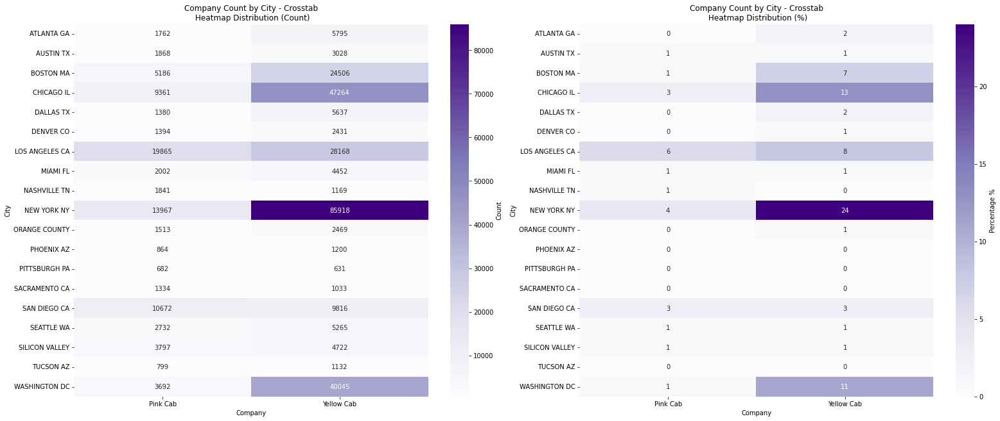

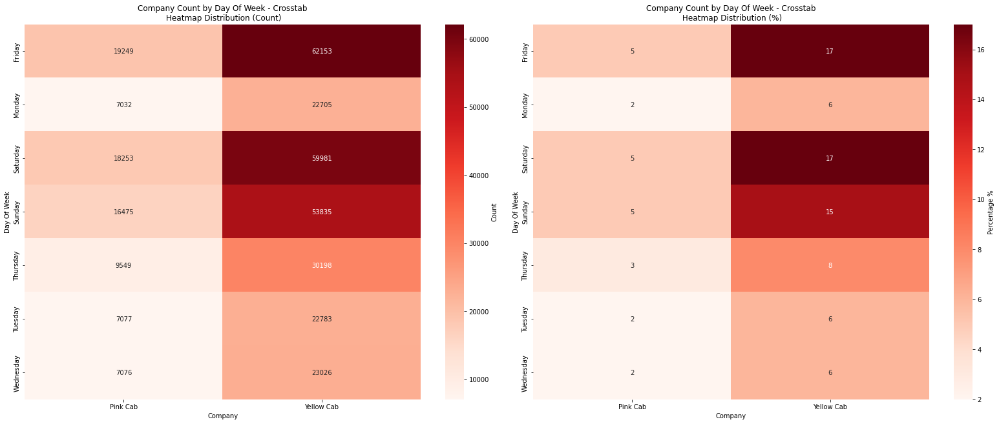

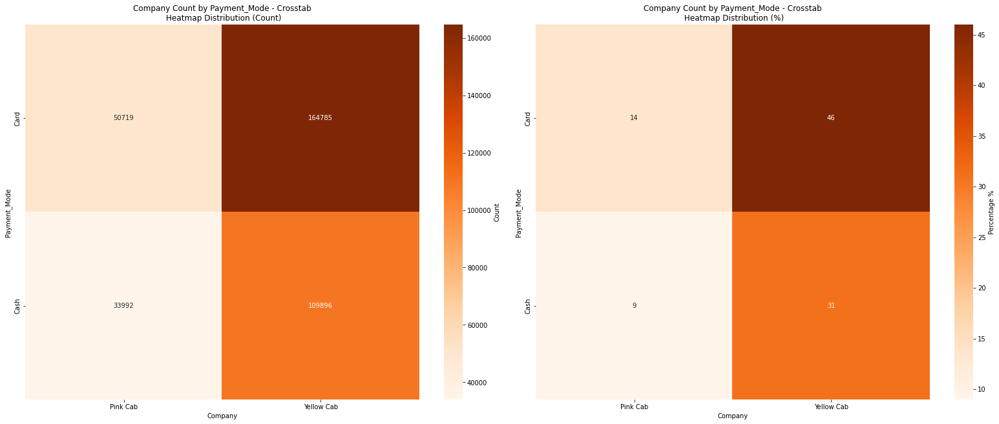

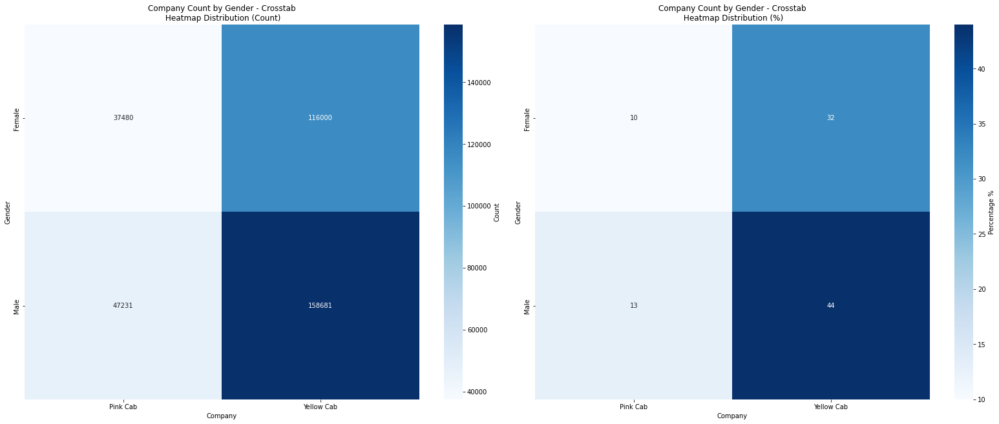

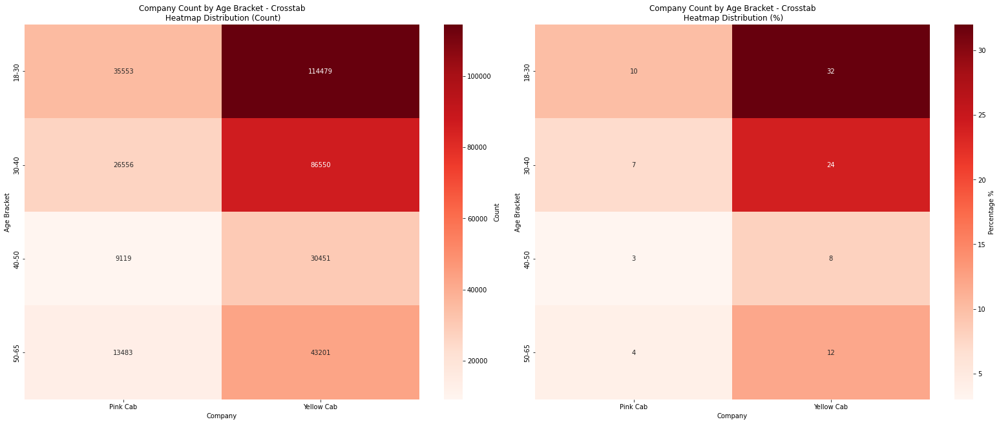

...

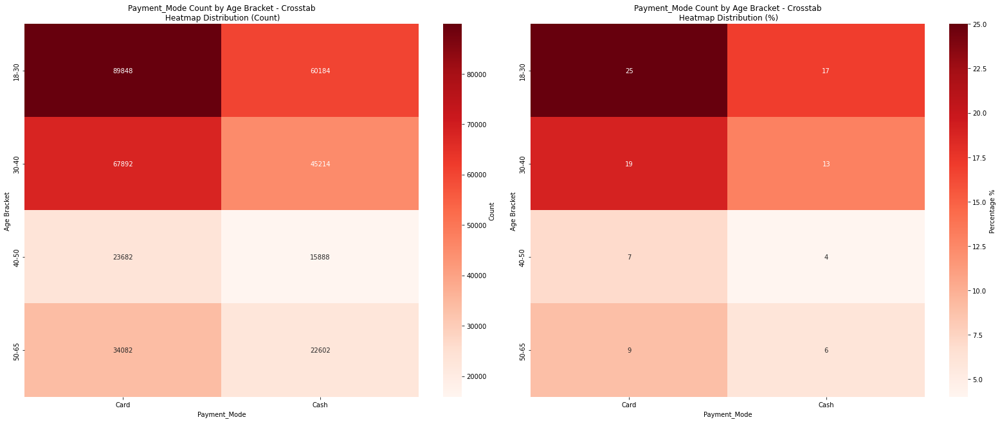

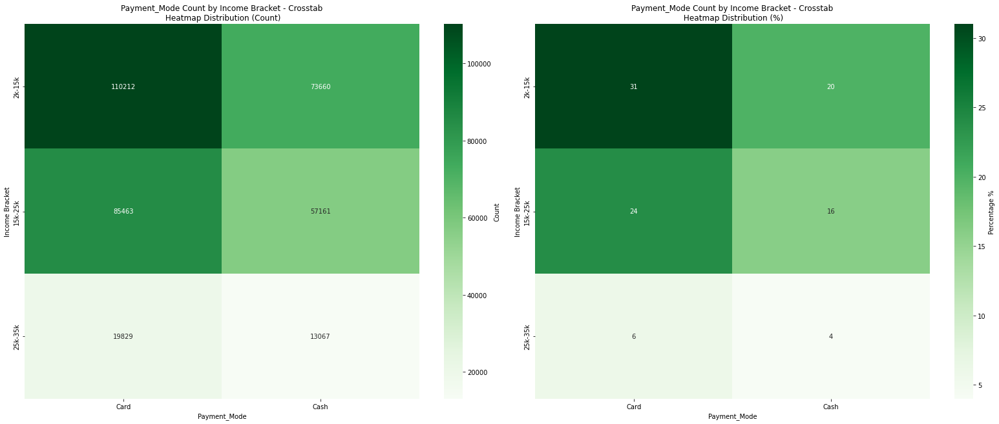

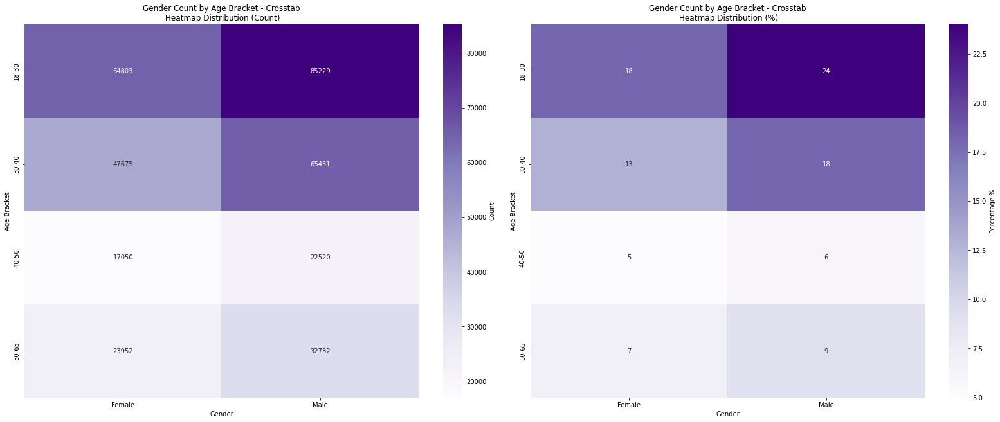

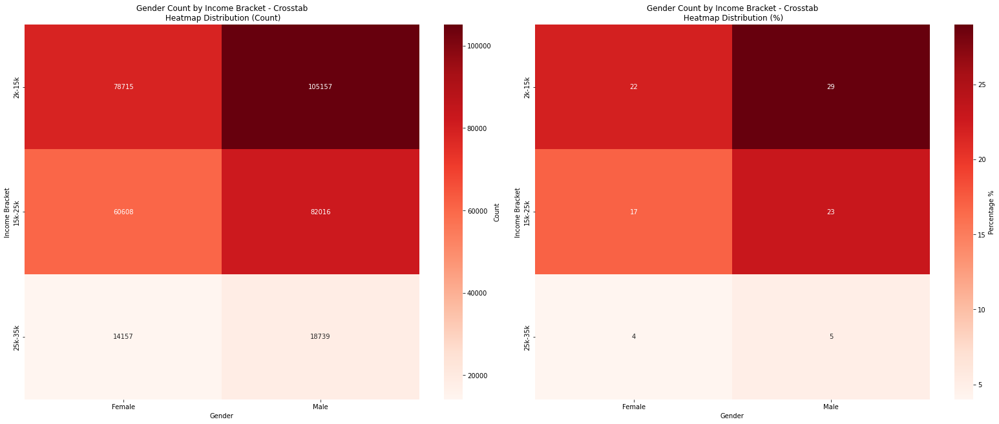

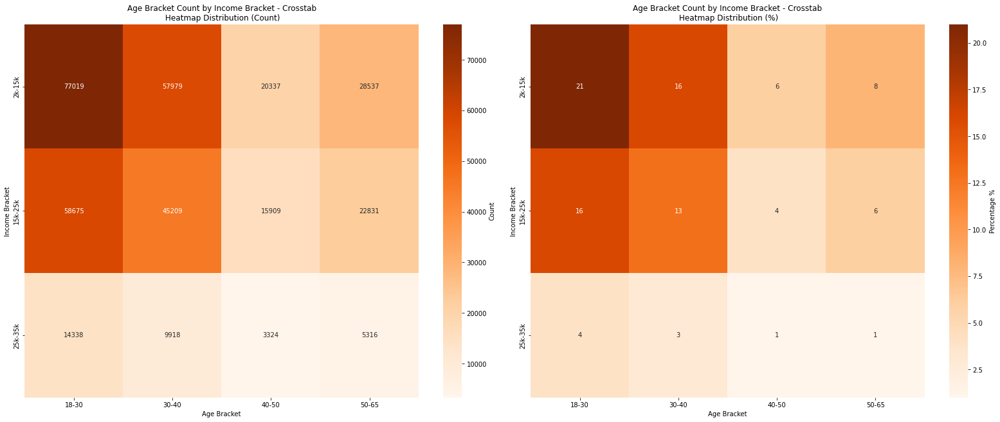

In [185]:
compare_cate_cate(['Company', 'City', 'Day Of Week', 'Payment_Mode', 'Gender', 'Age Bracket', 'Income Bracket'], df_full)

Comment:
- Similar insights found in the univariate analysis will not be discuss, only interesting findings will be list below
- Insight#3: The majority of the transaction is from Yellow Cab from 3 cities: New York(24%), Chicago(13%), Washington DC(11%)
- Insight#4: The majority of the transaction is at weekends (Fri, Sat, Sun) for both companies.

#### Categorical vs Numeric

In [186]:
def compare_cate_cont(list_cate_col, list_cont_col, df):
    for cate_col in list_cate_col:
        for cont_col in list_cont_col:
            print('*Box plot: ')
            plt.figure(figsize=(12, 10))
            sns.boxplot(x=cont_col, y=cate_col, data=df, palette="Set3")
            plt.show()

*Box plot: 


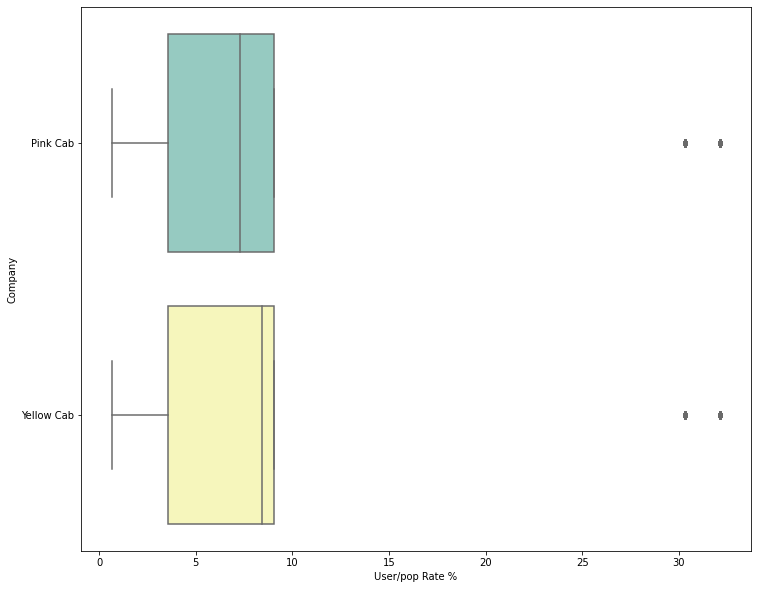

*Box plot: 


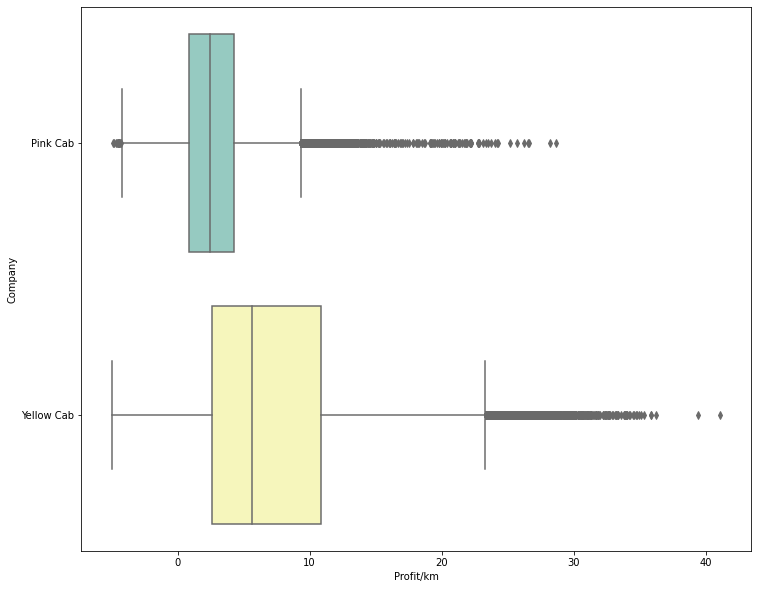

*Box plot: 


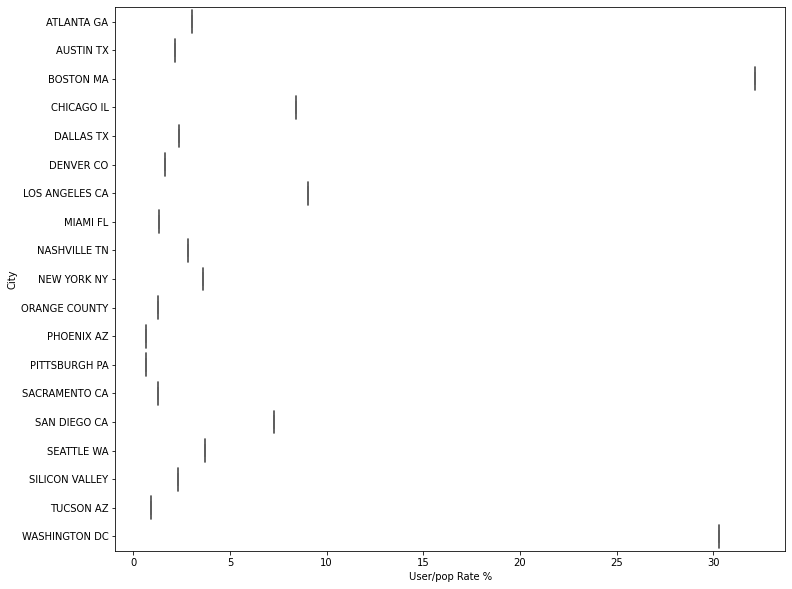

*Box plot: 


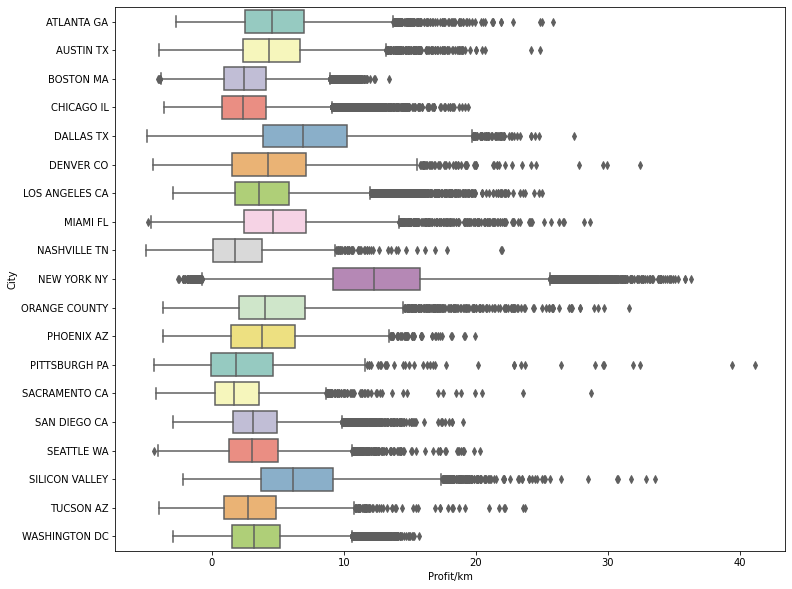

*Box plot: 


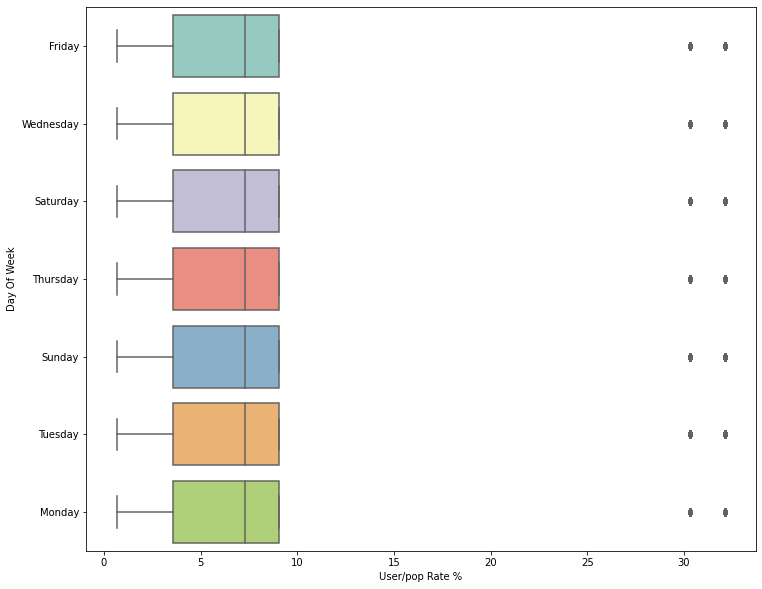

*Box plot: 


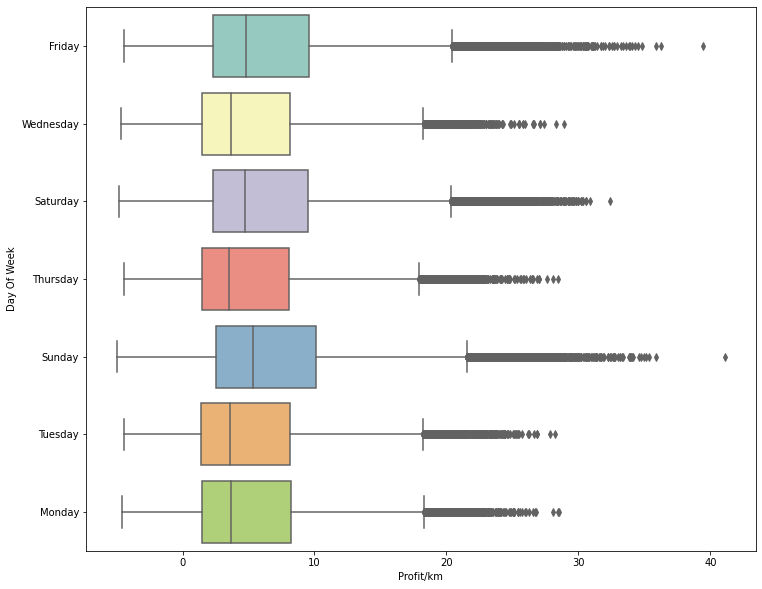

*Box plot: 


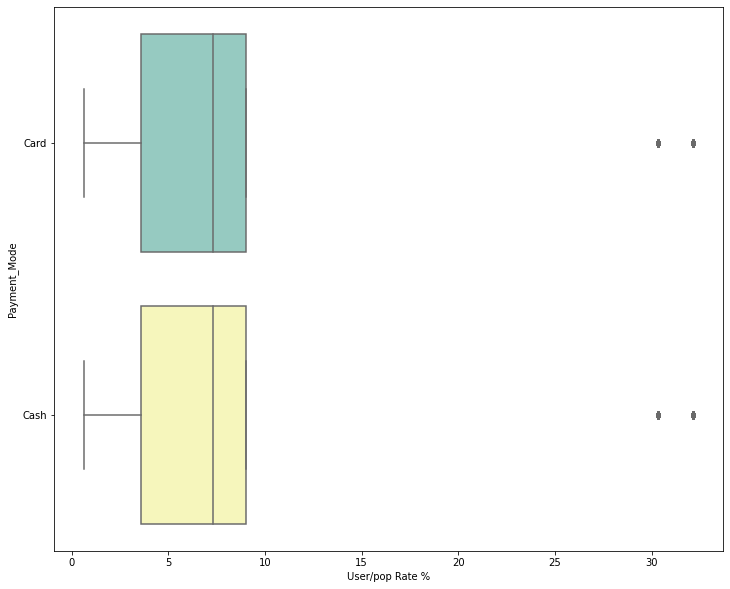

*Box plot: 


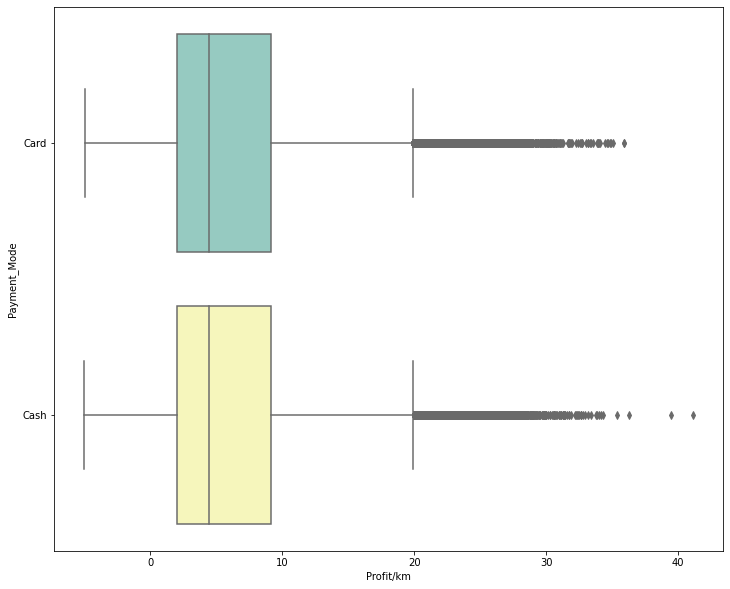

*Box plot: 


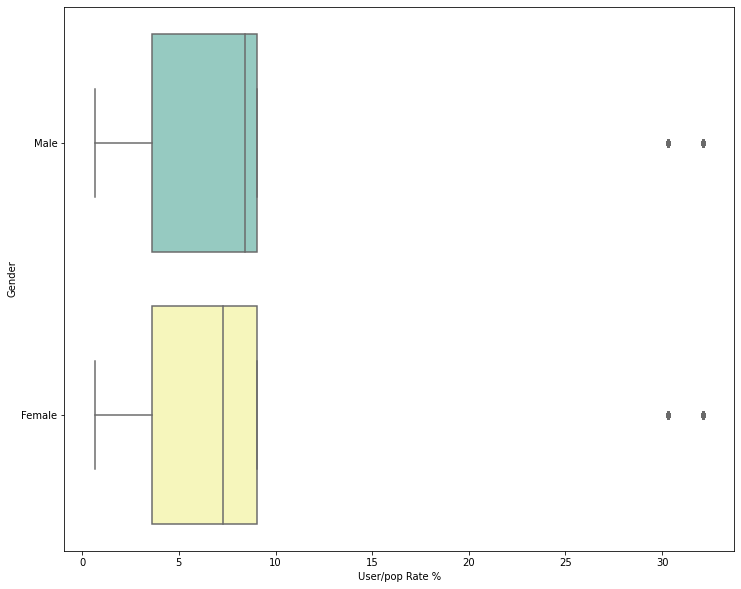

*Box plot: 


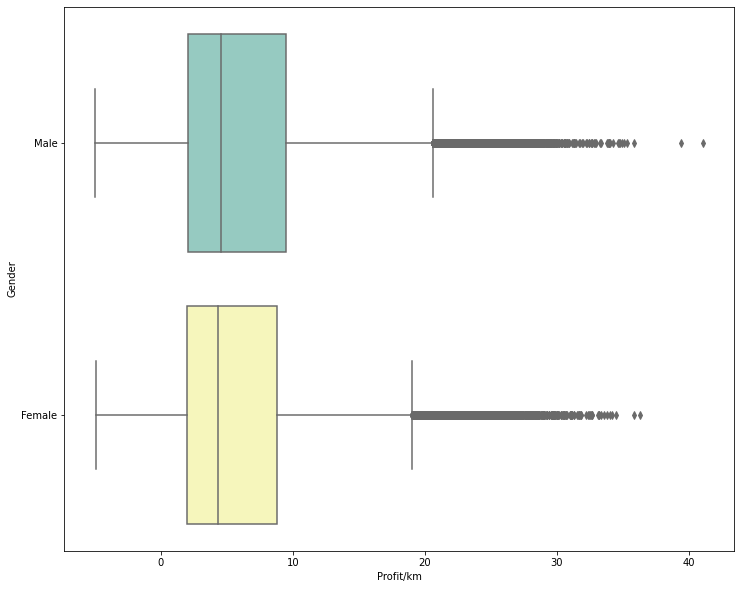

*Box plot: 


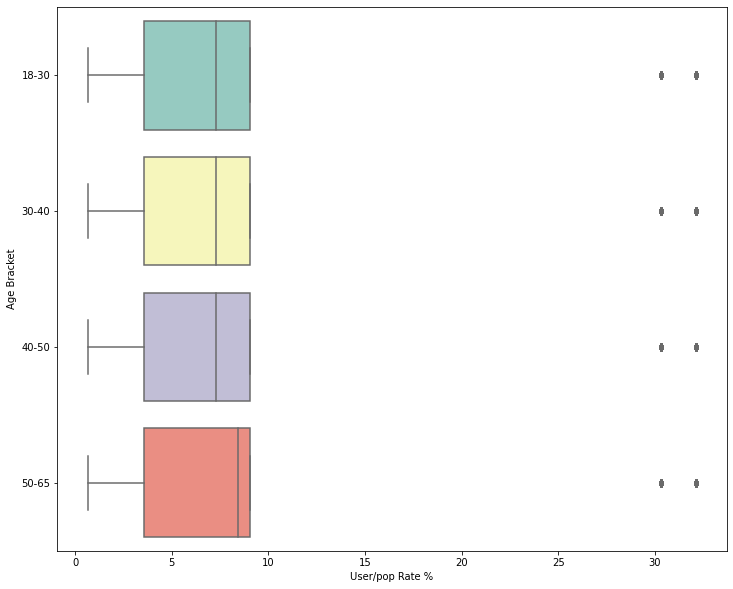

*Box plot: 


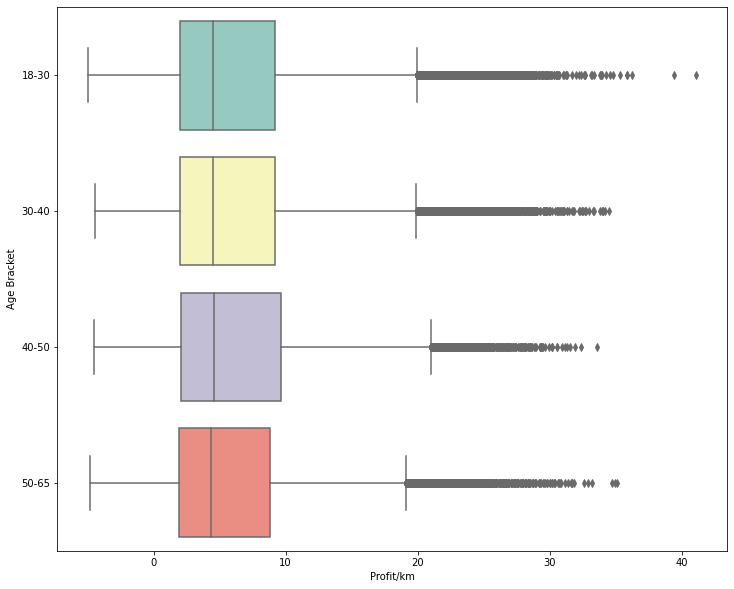

*Box plot: 


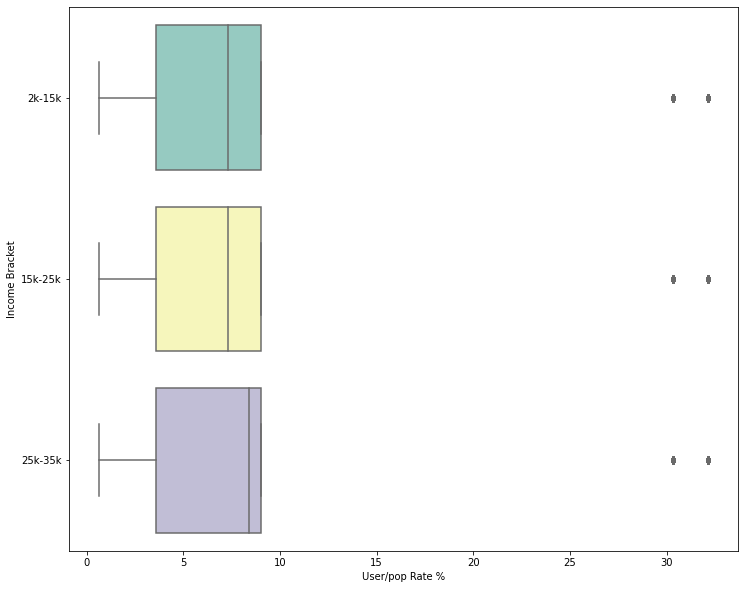

*Box plot: 


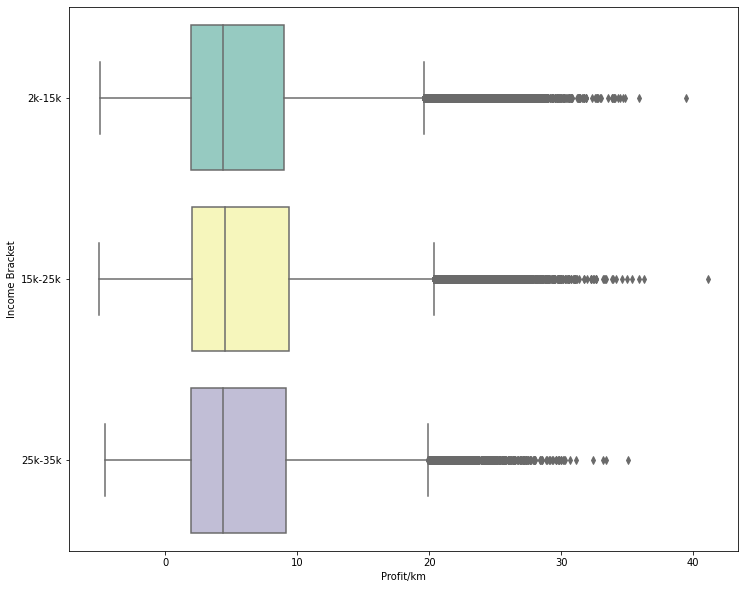

In [187]:
compare_cate_cont(['Company', 'City', 'Day Of Week', 'Payment_Mode', 'Gender', 'Age Bracket', 'Income Bracket'], ['User/pop Rate %', 'Profit/km'], df_full)

Comment:
- Insight#5: The Yellow Cab made more Profit/km than the Pink Cab
- Insight#6: New York has the highest Profit/km out of any city (mean > 10$)

## Conclusion - Recommendation

- Insight#1: Weekends (Fri, Sat, Sun) accounted for 64% of the transaction. Businesses should prepare more workforce and resources on the weekend occasion
- Insight#2: In a big city the user of cab companies is higher than the city which has low population
- Insight#3: The majority of the transaction is from Yellow Cab from 3 cities: New York(24%), Chicago(13%), Washington DC(11%)
- Insight#4: The Yellow Cab made more Profit/km than the Pink Cab
- Insight#5: New York has the highest Profit/km out of any city (mean > 10$)

Comment: This is a general important insight after I made a simple thoughout exploratory of the dataset. More hypothesis, forecast related to Profit and Date of Travel will be provided as well as comparison between 2 companies to help BOM decide which to invest in Week 3

# EDA for reseach questions:
- Which cab company should we invest?
- Which city should we invest in to maximize the profit?
- What are the segments of customer in our business?
- What are the other segments in our business?
- What is the prediction for the profit in the future?

### Feature engineering Year and Month column

In [190]:
# extract Month
df_full['Month'] = df_full['Date of Travel'].dt.month
df_full.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,...,Payment_Mode,Gender,Age,Income (USD/Month),Age Bracket,Income Bracket,Population,Users,User/pop Rate %,Month
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,...,Card,Male,28,10813,18-30,2k-15k,814885,24701,3.03,1
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,...,Card,Male,27,9237,18-30,2k-15k,814885,24701,3.03,1


In [191]:
# extract Year
df_full['Year'] = df_full['Date of Travel'].dt.year
df_full.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,...,Gender,Age,Income (USD/Month),Age Bracket,Income Bracket,Population,Users,User/pop Rate %,Month,Year
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,...,Male,28,10813,18-30,2k-15k,814885,24701,3.03,1,2016
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,...,Male,27,9237,18-30,2k-15k,814885,24701,3.03,1,2016


In [305]:
# format datetime for timeseries analysis later
df_full['Monthly'] = '01' + '/' + df_full['Month'].astype('str') + '/' + df_full['Year'].astype('str')
df_full['Monthly'] = pd.to_datetime(df_full['Monthly'], format='%d/%m/%Y')
df_full.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,...,Age,Income (USD/Month),Age Bracket,Income Bracket,Population,Users,User/pop Rate %,Month,Year,Monthly
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,...,28,10813,18-30,2k-15k,814885,24701,3.03,1,2016,2016-01-01
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,...,27,9237,18-30,2k-15k,814885,24701,3.03,1,2016,2016-01-01


In [192]:
# format Year into categorical
df_full['Year'] = df_full['Year'].astype('str')

In [401]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Transaction ID      359392 non-null  int64         
 1   Date of Travel      359392 non-null  datetime64[ns]
 2   Company             359392 non-null  object        
 3   City                359392 non-null  object        
 4   KM Travelled        359392 non-null  float64       
 5   Price Charged       359392 non-null  float64       
 6   Cost of Trip        359392 non-null  float64       
 7   Profit              359392 non-null  float64       
 8   Profit/km           359392 non-null  float64       
 9   Day Of Week         359392 non-null  object        
 10  Customer ID         359392 non-null  int64         
 11  Payment_Mode        359392 non-null  object        
 12  Gender              359392 non-null  object        
 13  Age                 359392 no

## Split the data into 2 companies

### Pink cab

In [310]:
# get pink cab data
df_pink = df_full[df_full['Company'] == 'Pink Cab']
df_pink.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,...,Age,Income (USD/Month),Age Bracket,Income Bracket,Population,Users,User/pop Rate %,Month,Year,Monthly
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.635,57.315,1.88,Friday,...,28,10813,18-30,2k-15k,814885,24701,3.03,1,2016,2016-01-01
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.854,23.666,0.83,Wednesday,...,27,9237,18-30,2k-15k,814885,24701,3.03,1,2016,2016-01-01


### Yellow cab

In [311]:
# get yellow cab data
df_yellow = df_full[df_full['Company'] == 'Yellow Cab']
df_yellow.head(2)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Profit,Profit/km,Day Of Week,...,Age,Income (USD/Month),Age Bracket,Income Bracket,Population,Users,User/pop Rate %,Month,Year,Monthly
233,10000384,2016-01-02,Yellow Cab,ATLANTA GA,33.93,1341.17,464.1624,877.0076,25.85,Saturday,...,23,8542,18-30,2k-15k,814885,24701,3.03,1,2016,2016-01-01
234,10000385,2016-01-09,Yellow Cab,ATLANTA GA,42.18,1412.06,516.2832,895.7768,21.24,Saturday,...,28,3901,18-30,2k-15k,814885,24701,3.03,1,2016,2016-01-01


## Compare 2 companies

### Yearly Profit (sum)

In [194]:
# group for visualization
# round() to suppress scientific notion
df_grouped_profit = df_full.groupby(by=['Company','Year'])['Profit'].agg('sum').round(2).reset_index()
df_grouped_profit['Profit (Mill USD)'] = (df_grouped_profit['Profit']/1000000).round(2)
df_grouped_profit

,Company,Year,Profit,Profit (Mill USD)
0,Pink Cab,2016,1713511.22,1.71
1,Pink Cab,2017,2033654.91,2.03
2,Pink Cab,2018,1560162.19,1.56
3,Yellow Cab,2016,13926995.43,13.93
4,Yellow Cab,2017,16575977.97,16.58
5,Yellow Cab,2018,13517399.77,13.52


[]

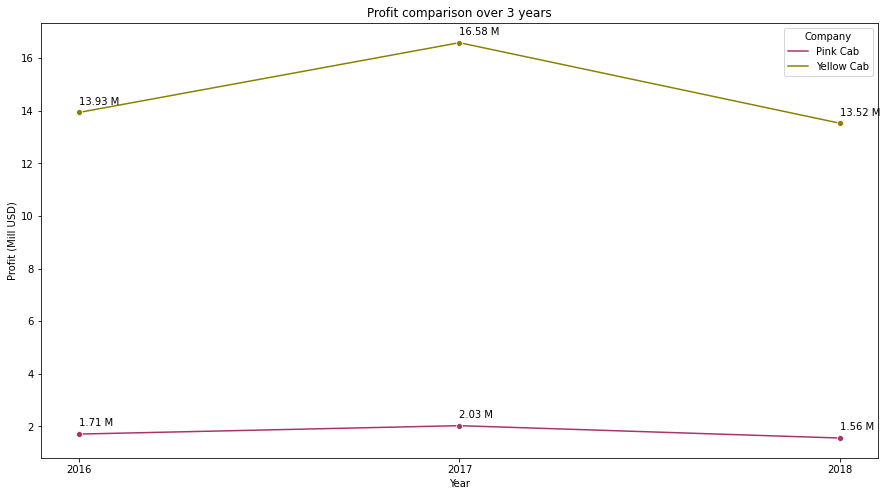

In [200]:
# setup size
plt.figure(figsize=(15, 8))

# setup yellow and color palette
colors = ['#AA336A', '#8B8000']
# setup yellow and color palette
sns.set_palette(sns.color_palette(colors))

# line plot
sns.lineplot(data=df_grouped_profit,
            x='Year', 
             y='Profit (Mill USD)', 
             hue='Company',
            marker='o').set(title='Profit comparison over 3 years')

# annotate label points
for i, profit in enumerate(df_grouped_profit['Profit (Mill USD)']):
    plt.text(df_grouped_profit['Year'][i] , df_grouped_profit['Profit (Mill USD)'][i]+0.3 , str(profit) + ' M')

plt.plot()

Comment: 
- We can see the Yellow Cab has substantial higher Profit compared to the Pink Cab. Both companies had a decreased in Profit in 2018.
- Yellow Cab had a decrease that lower around 3 milions in the Profit. However, it still relatively high and nearly as much as 2016.

### Yearly Profit/km (avg)

In [196]:
# group for visualization
# round() to suppress scientific notion
df_grouped_profit_km = df_full.groupby(by=['Company', 'Year'])['Profit/km'].agg('mean').round(2).reset_index()
df_grouped_profit_km

,Company,Year,Profit/km
0,Pink Cab,2016,3.03
1,Pink Cab,2017,2.96
2,Pink Cab,2018,2.35
3,Yellow Cab,2016,7.49
4,Yellow Cab,2017,7.49
5,Yellow Cab,2018,6.36


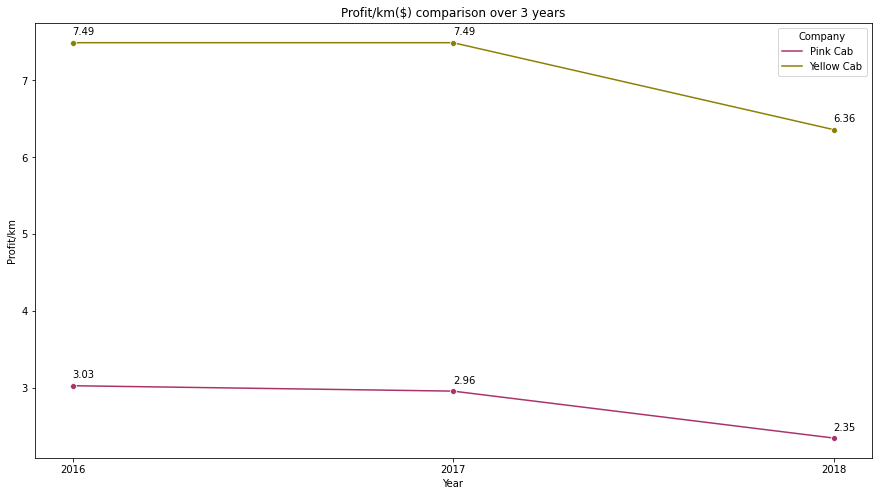

In [201]:
# setup size
plt.figure(figsize=(15, 8))

# setup yellow and color palette
sns.set_palette(sns.color_palette(colors))

# line plot
sns.lineplot(data=df_grouped_profit_km,
            x='Year',
            y='Profit/km',
            hue='Company',
            marker='o').set(title='Profit/km($) comparison over 3 years')


# annotate label points
for i, profit_avg in enumerate(df_grouped_profit_km['Profit/km']):
    plt.text(df_grouped_profit_km['Year'][i], df_grouped_profit_km['Profit/km'][i]+0.1, profit_avg)

Comment: 
- The Profit/km in Yellow Cab company is much higher than Pink Cab. Both had a decrease in 2018.
- The Profit/km is only decrease in 2018 for Yellow Cab. The Profit/km remained the same in 2016 and 2017.

### Total transaction (sum)

In [204]:
# group for visualization
df_grouped_transaction = df_full.groupby(by=['Company', 'Year'])['Transaction ID'].agg('count').reset_index()
df_grouped_transaction

,Company,Year,Transaction ID
0,Pink Cab,2016,25080
1,Pink Cab,2017,30321
2,Pink Cab,2018,29310
3,Yellow Cab,2016,82239
4,Yellow Cab,2017,98189
5,Yellow Cab,2018,94253


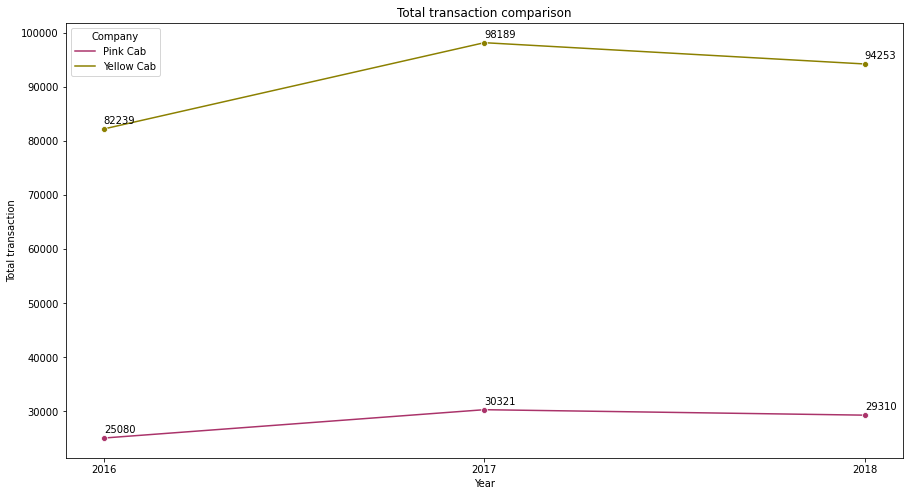

In [215]:
# setup size
plt.figure(figsize=(15, 8))

# setup yellow and color palette
sns.set_palette(sns.color_palette(colors))

# line plot
sns.lineplot(data=df_grouped_transaction,
            x='Year',
            y='Transaction ID',
            hue='Company',
            marker='o').set(title='Total transaction comparison', 
                           ylabel='Total transaction')

# annotate label points
for i, trans in enumerate(df_grouped_transaction['Transaction ID']):
    plt.text(df_grouped_transaction['Year'][i], df_grouped_transaction['Transaction ID'][i] + 1000, trans)

Comment:
- The Total transaciton in Yellow Cab company was much higher than Pink Cab. Both had a decrease in 2018
- There was a slight drop in Pink Cab compared to Yellow Cab.
- Number of transactions in Yellow Cab was also much higher

Recommendation #1: We should invest in the Yellow Cab since it had higher profit, amount of transactions (larger market), has a potential (the Profit did not drop so much). With correct strategy, we can leverage the brands and increase the profit. Next recommendation will go into details of the strategies.

## Strategy

### Check the city

In [313]:
# group for visualization
df_grouped_city = df_yellow.groupby(by=['City']).agg({'Profit': 'sum', 'Transaction ID': 'count'}).round(2).reset_index()
df_grouped_city['Profit/transaction'] = (df_grouped_city['Profit']/df_grouped_city['Transaction ID']).round(2)  
df_grouped_city = df_grouped_city.sort_values(by='Profit/transaction', ascending=False)
df_grouped_city['Profit'] = (df_group_city['Profit']/1000000).round(2)
df_grouped_city

,City,Profit,Transaction ID,Profit/transaction
9,NEW YORK NY,27.96,85918,307.86
16,SILICON VALLEY,1.32,4722,206.79
4,DALLAS TX,1.13,5637,195.85
5,DENVER CO,0.40,2431,146.85
10,ORANGE COUNTY,0.46,2469,143.79
7,MIAMI FL,0.76,4452,133.87
11,PHOENIX AZ,0.19,1200,131.12
0,ATLANTA GA,0.84,5795,128.80
1,AUSTIN TX,0.53,3028,125.25
6,LOS ANGELES CA,4.41,28168,116.66


<Figure size 1440x576 with 0 Axes>

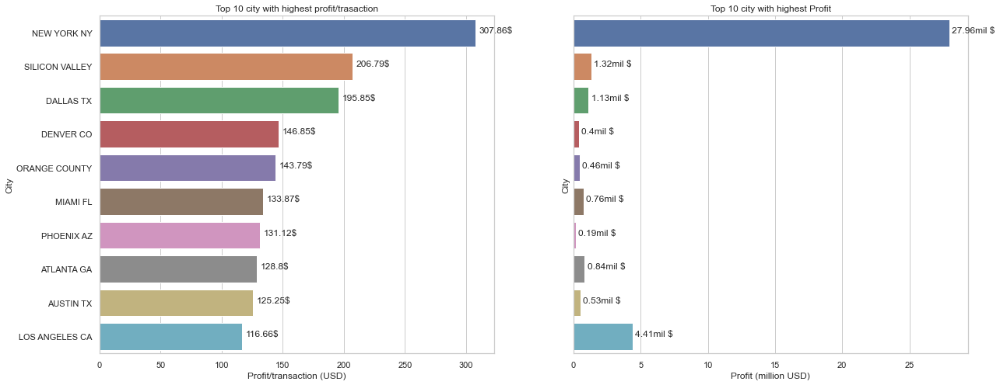

In [341]:
# setup size, subplots
plt.figure(figsize=(20, 8))

# subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8), sharey=True)

# setup theme
sns.set_theme(style='whitegrid')

# plot top 10 profit/transaction
sns.barplot(ax=axes[0],
            data=df_grouped_city.head(10),
           y='City',
           x='Profit/transaction').set(title='Top 10 city with highest profit/trasaction',
                                      xlabel='Profit/transaction (USD)')
# annotate label points
for i, profit_tran in enumerate(df_grouped_city['Profit/transaction'].head(10)):
    axes[0].text(profit_tran+3, i, str(profit_tran)+'$')

sns.barplot(ax=axes[1],
            data=df_grouped_city.head(10),
           y='City',
           x='Profit').set(title='Top 10 city with highest Profit',
                          xlabel='Profit (million USD)')

# annotate label points
for i, profit in enumerate(df_grouped_city['Profit'].head(10)):
    axes[1].text(profit+0.2, i, str(profit)+'mil $')

plt.show()

Comment:
- New york city is the highest profit market and profit/transaction. The resources should be focused on this market to optimize the cost and return on investment
- Although Los Angeles had very high profit (4,41 mil USD in total), Dallas and Sillicon Valley should have attention in the marketing since it had low profit but very high profit per transaction, which mean it has very high potential in this segment.

### Predict profit

In [321]:
# grouping for analysis
df_grouped_datetime = df_yellow.groupby(by='Monthly')['Profit'].agg('sum').round(2).reset_index()
df_grouped_datetime['Profit'] = (df_grouped_datetime['Profit']/1000000).round(2)
df_grouped_datetime = df_grouped_datetime.set_index('Monthly')
df_grouped_datetime

,Profit
Monthly,
2016-01-01,0.84
2016-02-01,1.01
2016-03-01,0.91
2016-04-01,0.95
2016-05-01,1.28
2016-06-01,1.25
2016-07-01,1.02
2016-08-01,0.85
2016-09-01,1.32


In [343]:
df_grouped_datetime.info() # 36 rows

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 36 entries, 2016-01-01 to 2018-12-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Profit  36 non-null     float64
dtypes: float64(1)
memory usage: 576.0 bytes


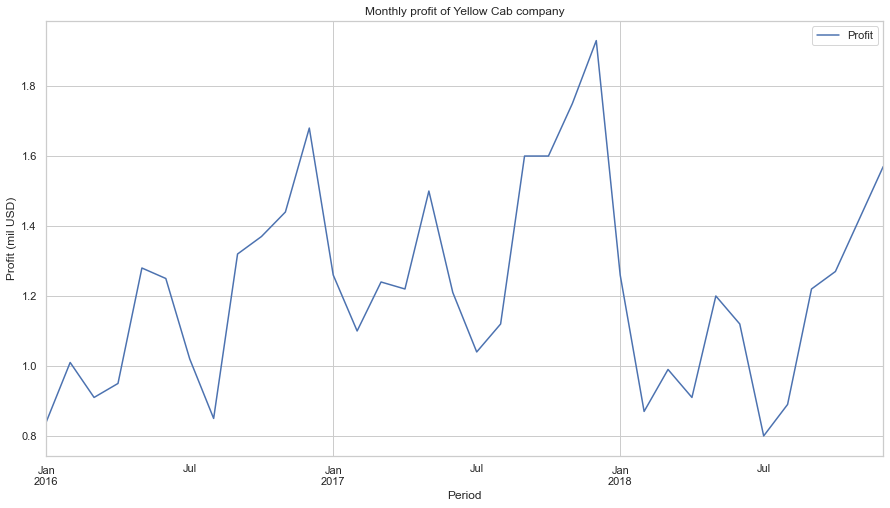

In [326]:
df_grouped_datetime.plot(figsize=(15,8))
plt.xlabel('Period')
plt.ylabel('Profit (mil USD)')
plt.title('Monthly profit of Yellow Cab company')
plt.show()

Commment:
- There was a fluctual rise from Jan-2016 to Jan-2018, then there was a sudden fall on Spring 2018 and a recover later on
- Yellow Cab reached its peak at the end of 2017
- There was a drop in the beginning of the year and increase at the end of the year. (There can be many factors, we need more information to make a conclusion, but in general this is an interesting insight)

### Decomposition (Let's see both additive and multiplicative to compare the result) for ARIMA model

We use multiplicative models when the magnitude of the seasonal pattern in the data depends on the magnitude of the data. On other hand, in the additive model, the magnitude of seasonality does not change in relation to time

In [330]:
result_mul = seasonal_decompose(df_grouped_datetime,
                               model='multiplicative')
result_mul

In [331]:
result_add = seasonal_decompose(df_grouped_datetime,
                               model='additive')
result_add

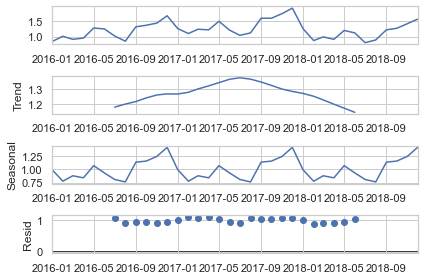

In [340]:
result_mul.plot()
plt.show()

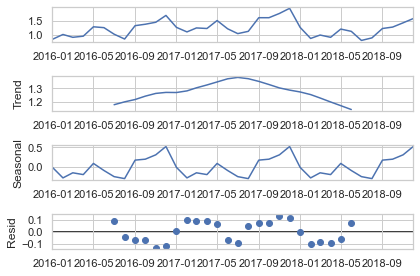

In [342]:
result_add.plot()
plt.show()

Comment:
- figures shows similar Trend and Seasonal
- However, Residual for Multiplicative is much more stable than Additive model
=> Choose multiplicative

### Split data by 75:25 for train:test

Data has 36 rows => 27 train, 9 test

In [344]:
train, test = df_grouped_datetime.iloc[:27, 0], df_grouped_datetime.iloc[27:, 0]

In [345]:
len(train)

27

In [346]:
len(test)

9

### Modeling with ARIMA

In [381]:
step_wise_model = auto_arima(df_grouped_datetime, 
                             m=12,
                            error_action='ignore',
                            suppress_warnings=True,
                            stepwise=True)

In [382]:
step_wise_model.aic()

-19.404039325188027

In [383]:
step_wise_model.fit(train)

ARIMA(maxiter=50, method='lbfgs', order=(0, 1, 0), out_of_sample_size=0,
      scoring='mse', scoring_args={}, seasonal_order=(0, 1, 0, 12),
      start_params=None, suppress_warnings=True, trend=None,
      with_intercept=False)

In [384]:
future_forecast = step_wise_model.predict(n_periods=len(test))

In [385]:
future_forecast = pd.DataFrame(future_forecast,
                              index=test.index,
                              columns=['Prediction'])

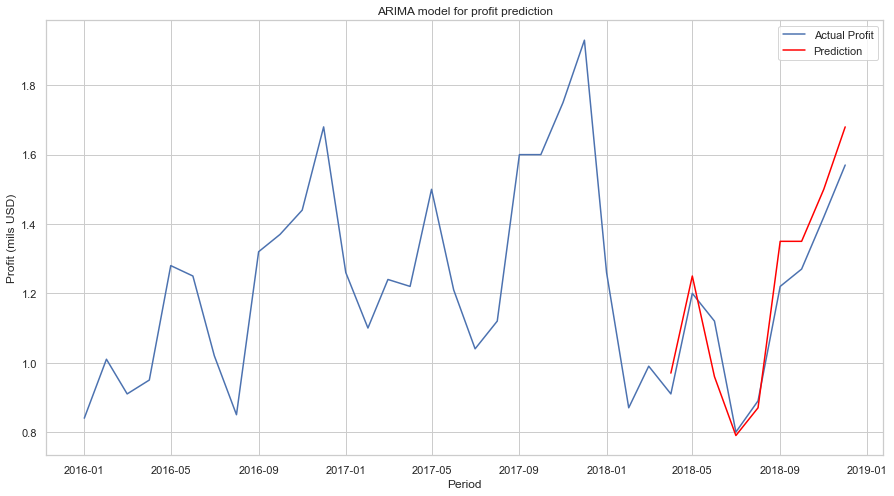

In [386]:
plt.figure(figsize=(15, 8))

plt.plot(df_grouped_datetime, label='Actual Profit')
plt.plot(future_forecast, label='Prediction', color='red')
plt.legend()
plt.title('ARIMA model for profit prediction')
plt.xlabel('Period')
plt.ylabel('Profit (mils USD)')
plt.show()

In [387]:
# predict next 3 months
future_forecast_3months = step_wise_model.predict(n_periods=len(test)+3)
future_forecast_3months

array([0.97, 1.25, 0.96, 0.79, 0.87, 1.35, 1.35, 1.5 , 1.68, 1.01, 0.62,
       0.74])

In [388]:
future_forecast_3months[9:]

array([1.01, 0.62, 0.74])

In [389]:
next_3_months = ['2019-01-01', '2019-02-01', '2019-03-01']

In [390]:
df_future_forecast_3months = pd.DataFrame(list(zip(future_forecast_3months[9:], next_3_months)), 
               columns =['Predict next 3 months', 'Monthly']) 
df_future_forecast_3months['Monthly'] = pd.to_datetime(df_future_forecast_3months['Monthly'])
df_future_forecast_3months.index = df_future_forecast_3months.Monthly
df_future_forecast_3months.drop(columns=['Monthly'], axis=1, inplace=True)
df_future_forecast_3months

,Predict next 3 months
Monthly,
2019-01-01,1.01
2019-02-01,0.62
2019-03-01,0.74


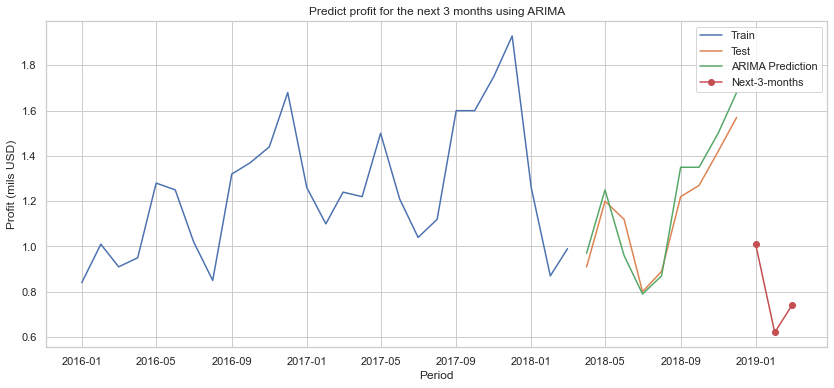

In [400]:
plt.figure(figsize=(14,6))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(future_forecast.index, future_forecast, label='ARIMA Prediction')
plt.plot(df_future_forecast_3months.index, df_future_forecast_3months, label='Next-3-months', marker='o')

plt.legend(loc='best')
plt.title('Predict profit for the next 3 months using ARIMA')
plt.xlabel('Period')
plt.ylabel('Profit (mils USD)')

plt.show()

Comment:
- Next 3 months will be a huge downtrend based on prediction, therefore we should wait until the end of the year to make an investment based on the seasonal trend